<a href="https://colab.research.google.com/github/jerin00/INSE6220_40221272/blob/main/Kidney_Stone_Prediction_based_on_Urine_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# install slim version (default): if you get an error message, run it again
!pip install pycaret==2.3.6

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 301 kB 4.0 MB/s 
     |████████████████████████████████| 1.3 MB 64.3 MB/s 
     |████████████████████████████████| 6.8 MB 46.2 MB/s 
     |████████████████████████████████| 325 kB 62.5 MB/s 
     |████████████████████████████████| 5.0 MB 34.5 MB/s 
     |████████████████████████████████| 662 kB 53.2 MB/s 
     |████████████████████████████████| 147 kB 76.3 MB/s 
     |████████████████████████████████| 25.8 MB 1.5 MB/s 
     |████████████████████████████████| 1.7 MB 53.2 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 16.5 MB 40.6 MB/s 
     |████████████████████████████████| 167 kB 63.0 MB/s 
     |████████████████████████████████| 2.0 MB 46.1 MB/s 
     |██████████████████████████████

In [2]:
#Run the below code in your notebook to check the installed version
from pycaret.utils import version
version()

'2.3.6'

In [146]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from google.colab import files
sns.set_theme(style="darkgrid")
import pandas as pd
plt.rcParams['figure.figsize'] = (7,5)

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

from sklearn import preprocessing
from sklearn import utils

from sklearn.model_selection import train_test_split, cross_validate, GridSearchCV
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc

from scipy.stats import beta
from scipy.stats import f

# import the metrics class
from sklearn import metrics

from itertools import cycle

import matplotlib as mpl

from numpy import where
from numpy import meshgrid
from numpy import arange
from numpy import hstack
from sklearn.datasets import make_blobs

# Machine Learning Modules
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier

In [4]:
print("Pandas version: ", pd.__version__)
print("Seaborn version: ", sns.__version__)

Pandas version:  1.3.5
Seaborn version:  0.11.2


Dataset
Dataset can be found at https://www.kaggle.com/datasets/vuppalaadithyasairam/kidney-stone-prediction-based-on-urine-analysis

In [ ]:
df=pd.read_csv("https://raw.githubusercontent.com/jerin00/INSE6220_40221272/main/kindey%20stone%20urine%20analysis.csv")
df.head(25)

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 79 entries, 0 to 78
Data columns (total 7 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   gravity  79 non-null     float64
 1   ph       79 non-null     float64
 2   osmo     79 non-null     int64  
 3   cond     79 non-null     float64
 4   urea     79 non-null     int64  
 5   calc     79 non-null     float64
 6   target   79 non-null     int64  
dtypes: float64(4), int64(3)
memory usage: 4.4 KB


In [8]:
print("Number of duplicated rows is: ", df.duplicated().sum())

Number of duplicated rows is:  0


In [9]:
print("Number of rows with NaNs is: ", df.isna().any(axis=1).sum())

Number of rows with NaNs is:  0


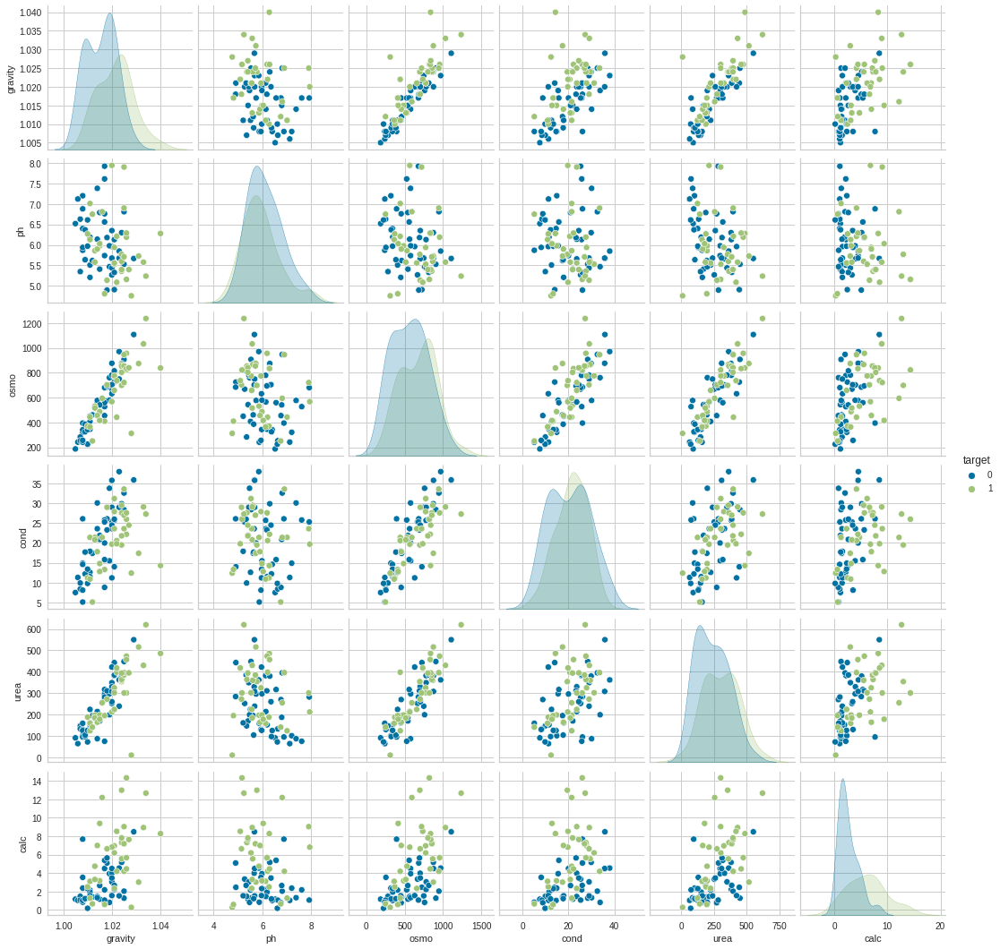

In [26]:
sns.pairplot(df, hue='target' )

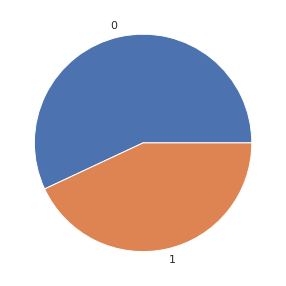

In [10]:
y =df['target']
y.value_counts().plot(kind='pie')
plt.ylabel('')
plt.show()

In [11]:
X = df.drop(columns=['target'])
X.head(10)

,gravity,ph,osmo,cond,urea,calc
0,1.021,4.91,725,14.0,443,2.45
1,1.017,5.74,577,20.0,296,4.49
2,1.008,7.20,321,14.9,101,2.36
3,1.011,5.51,408,12.6,224,2.15
4,1.005,6.52,187,7.5,91,1.16
5,1.020,5.27,668,25.3,252,3.34
6,1.012,5.62,461,17.4,195,1.40
7,1.029,5.67,1107,35.9,550,8.48
8,1.015,5.41,543,21.9,170,1.16
9,1.021,6.13,779,25.7,382,2.21


In [12]:
X.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
gravity,79.0,1.018114,0.007239,1.005,1.012,1.018,1.0235,1.04
ph,79.0,6.028481,0.724307,4.760,5.530,5.940,6.3850,7.94
osmo,79.0,612.848101,237.514755,187.000,413.000,594.000,792.0000,1236.00
cond,79.0,20.813924,7.938994,5.100,14.150,21.400,26.5500,38.00
urea,79.0,266.405063,131.254550,10.000,160.000,260.000,372.0000,620.00
calc,79.0,4.138987,3.260051,0.170,1.460,3.160,5.9300,14.34


In [13]:
Xs = StandardScaler().fit_transform(X)
Xcols = X.columns
X = pd.DataFrame(Xs)
X.columns = Xcols
X.head(10)

,gravity,ph,osmo,cond,urea,calc
0,0.401206,-1.554076,0.475206,-0.863770,1.354036,-0.521397
1,-0.154851,-0.400830,-0.151894,-0.103177,0.226918,0.108359
2,-1.405980,1.627769,-1.236609,-0.749681,-1.268238,-0.549180
3,-0.988937,-0.720404,-0.867976,-1.041241,-0.325139,-0.614008
4,-1.823023,0.682942,-1.804390,-1.687745,-1.344912,-0.919624
5,0.262192,-1.053873,0.233688,0.568679,-0.110450,-0.246650
6,-0.849923,-0.567565,-0.643406,-0.432767,-0.547496,-0.845535
7,1.513320,-0.498092,2.093804,1.912393,2.174455,1.340087
8,-0.432880,-0.859350,-0.295958,0.137677,-0.739183,-0.919624
9,0.401206,0.141056,0.704013,0.619385,0.886320,-0.595485


In [14]:
X.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
gravity,79.0,-4.145137e-14,1.00639,-1.823023,-0.849923,-0.015837,0.748742,3.042477
ph,79.0,2.893689e-15,1.00639,-1.762493,-0.692615,-0.122940,0.495366,2.655964
osmo,79.0,-2.164232e-16,1.00639,-1.804390,-0.846790,-0.079863,0.759097,2.640399
cond,79.0,2.220446e-16,1.00639,-1.991982,-0.844755,0.074294,0.727136,2.178600
urea,79.0,-1.124276e-17,1.00639,-1.965977,-0.815857,-0.049111,0.809646,2.711177
calc,79.0,4.637640e-16,1.00639,-1.225241,-0.827013,-0.302217,0.552892,3.149090


In [15]:
observations = list(df.index)
variables = list(df.columns)

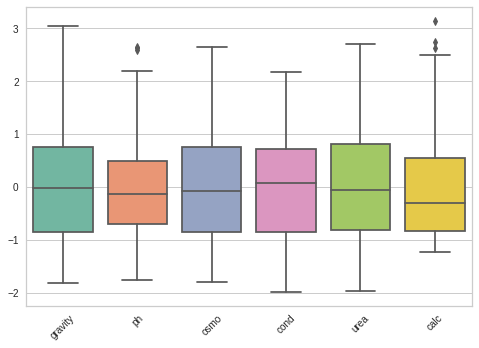

In [27]:
ax = plt.figure()
ax = sns.boxplot(data=X, orient="v", palette="Set2")
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);

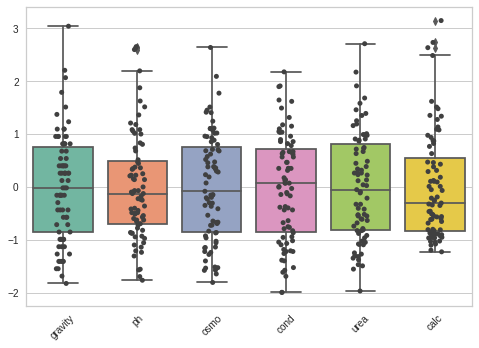

In [28]:
# Use swarmplot() or stripplot to show the datapoints on top of the boxes:
#plt. figure()
ax = plt.figure()    
ax = sns.boxplot(data=X, orient="v", palette="Set2")
ax = sns.stripplot(data=X, color=".25") 
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);

# Correlation Matrix

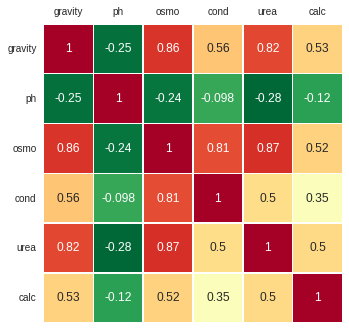

In [29]:
ax = sns.heatmap(X.corr(), cmap='RdYlGn_r', linewidths=0.5, annot=True, cbar=False, square=True)
plt.yticks(rotation=0)
ax.tick_params(labelbottom=False,labeltop=True)
ax.set_xticklabels(ax.get_xticklabels(),rotation=0);

#X.corr().style.background_gradient(cmap='coolwarm').set_precision(2)
#sns.clustermap(X.corr(), annot=True, fmt='.2f')

# Principal Component Analysis (PCA)

Text(0, 0.5, '$Z_2$')

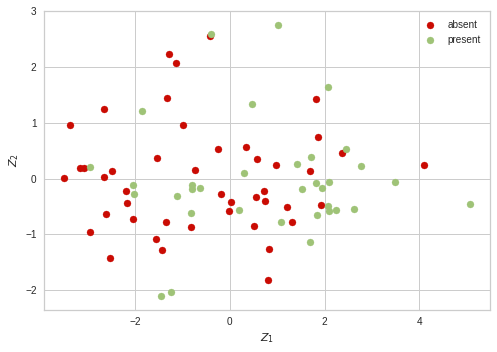

In [30]:
pca = PCA()
Z = pca.fit_transform(X)

# 1(absent)->0,  2(present)->1
idx_absent = np.where(y == 0)
idx_present = np.where(y == 1)


plt. figure()
plt.scatter(Z[idx_absent,0], Z[idx_absent,1], c='r', label='absent')
plt.scatter(Z[idx_present,0], Z[idx_present,1], c='g', label='present')


plt.legend()
plt.xlabel('$Z_1$')
plt.ylabel('$Z_2$')

# Eigenvectors

array([[ 0.47433187, -0.00744727,  0.03519482,  0.36937041,  0.77934679,
         0.17291392],
       [-0.16865268,  0.94964363,  0.07203572,  0.25373114, -0.01000544,
        -0.00803152],
       [ 0.5079431 ,  0.08963474, -0.20375692,  0.02885   , -0.13053641,
        -0.82132239],
       [ 0.392481  ,  0.27016635, -0.52628258, -0.58940901, -0.01860307,
         0.3850278 ],
       [ 0.46737372, -0.05908358,  0.0561153 ,  0.50388919, -0.61147335,
         0.3835597 ],
       [ 0.34070493,  0.11664647,  0.81971521, -0.44389908, -0.03511387,
         0.01006766]])

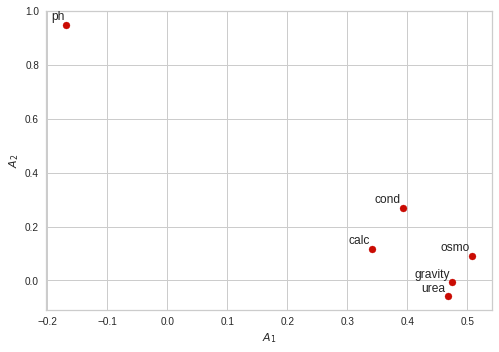

In [31]:
A = pca.components_.T 

plt.scatter(A[:,0],A[:,1],c='r')
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for label, x, y in zip(variables, A[:, 0], A[:, 1]):
  plt.annotate(label, xy=(x, y), xytext=(-2, 2), textcoords='offset points', ha='right', va='bottom')
A

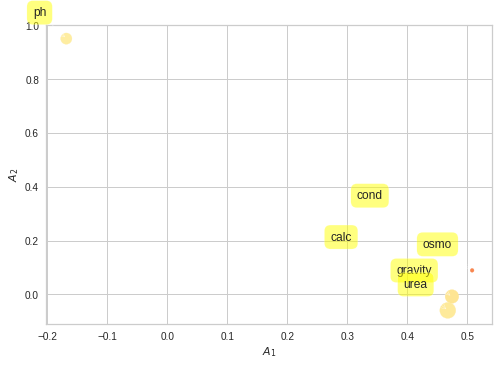

In [32]:
plt.scatter(A[:, 0],A[:, 1], marker='o', c=A[:, 2], s=A[:, 3]*500, cmap=plt.get_cmap('Spectral'))
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for label, x, y in zip(variables,A[:, 0],A[:, 1]):
  plt.annotate(label,xy=(x, y), xytext=(-20, 20),
      textcoords='offset points', ha='right', va='bottom',
      bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5),
      arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0'))

# Scree Plot

array([3.71115319, 0.96635361, 0.69994954, 0.49907425, 0.1780875 ,
       0.02230499])

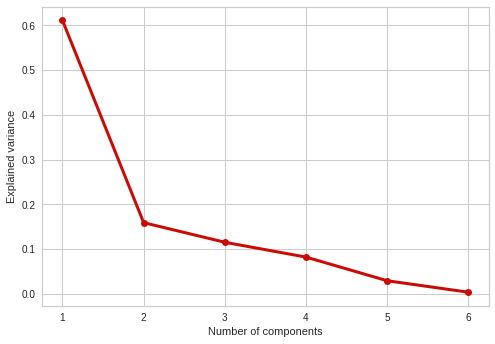

In [33]:
#Eigenvalues
Lambda = pca.explained_variance_ 

#Scree plot
x = np.arange(len(Lambda)) + 1
plt.plot(x,Lambda/sum(Lambda), 'ro-', lw=3)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance') 
Lambda

# Explained Variance

Proportion of Variance Explained :  [0.61069609 0.15902021 0.11518157 0.08212614 0.02930554 0.00367044]
Explained Variances (percentage):  [61.06960947 15.90202149 11.518157    8.21261422  2.93055373  0.36704408]
Cumulative Prop. Variane Explained :  [0.61069609 0.76971631 0.88489788 0.96702402 0.99632956 1.        ]


Text(0, 0.5, 'Cumulative explained variance')

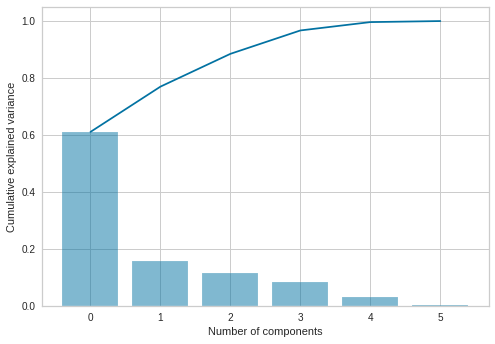

In [34]:
ell = pca.explained_variance_ratio_
print ("Proportion of Variance Explained : ", pca.explained_variance_ratio_)
print ("Explained Variances (percentage): ", pca.explained_variance_ratio_ * 100)
A1= A[:,0]
A2= A[:,0]
out_sum= np.cumsum(pca.explained_variance_ratio_)
print ("Cumulative Prop. Variane Explained : ", out_sum)


ind = np.arange(len(ell))
plt.bar(ind, ell, align='center', alpha=0.5)
plt.plot(np.cumsum(ell))
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')

# Biplot

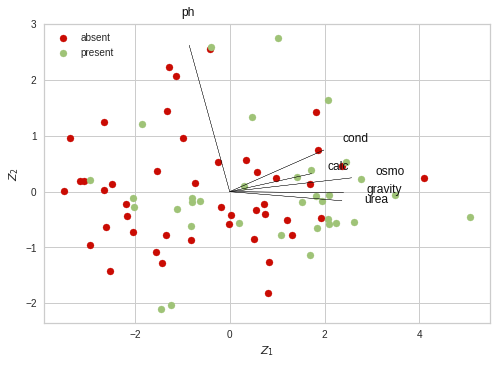

In [35]:
# 0,1 denote PC1 and PC2; change values for other PCs
A1 = A[:,0] 
A2 = A[:,1]
Z1 = Z[:,0] 
Z2 = Z[:,1]

plt.figure()
plt.xlabel('$Z_1$')
plt.ylabel('$Z_2$')
for i in range(len(A1)):
# arrows project features as vectors onto PC axes
  plt.arrow(0, 0, A1[i]*max(Z1), A2[i]*max(Z2), color='k', width=0.0005, head_width=0.0025)
  plt.text(A1[i]*max(Z1)*1.2, A2[i]*max(Z2)*1.2,variables[i], color='k')

plt.scatter(Z[idx_absent,0], Z[idx_absent,1], c='r', label='absent')
plt.scatter(Z[idx_present,0], Z[idx_present,1], c='g', label='present')
plt.legend(loc='upper left')

# Using PCA Library

In [36]:
!pip install pca

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [37]:
from pca import pca
# Initialize and keep all PCs
model = pca()
# Fit transform
out = model.fit_transform(X)

[pca] >Processing dataframe..
[pca] >The PCA reduction is performed to capture [95.0%] explained variance using the [6] columns of the input data.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Number of components is [4] that covers the [95.00%] explained variance.
[pca] >The PCA reduction is performed on the [6] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[4]
[pca] >Outlier detection using SPE/DmodX with n_std=[2]


# Principal Components

In [38]:
out['PC']

,PC1,PC2,PC3,PC4
0,0.809967,-1.810393,-0.091483,1.190431
1,0.019475,-0.421750,0.152483,-0.036228
2,-2.643641,1.253762,0.192947,-0.095390
3,-1.558293,-1.088283,0.116586,0.149326
4,-3.500730,0.016611,0.411623,0.173162
...,...,...,...,...
74,1.026329,2.759613,1.196848,0.280495
75,-1.228545,-2.036798,-0.382313,0.261672
76,1.838112,-0.654627,0.722316,0.018785
77,0.473028,1.341741,2.079977,-1.027808


Scatter plot

[colourmap]> Warning: Colormap [Set1] can not create [79] unique colors! Available unique colors: [9].
[colourmap]> Warning: Colormap [Set1] can not create [79] unique colors! Available unique colors: [9].


(<Figure size 1440x1080 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7fb34f6e3610>)

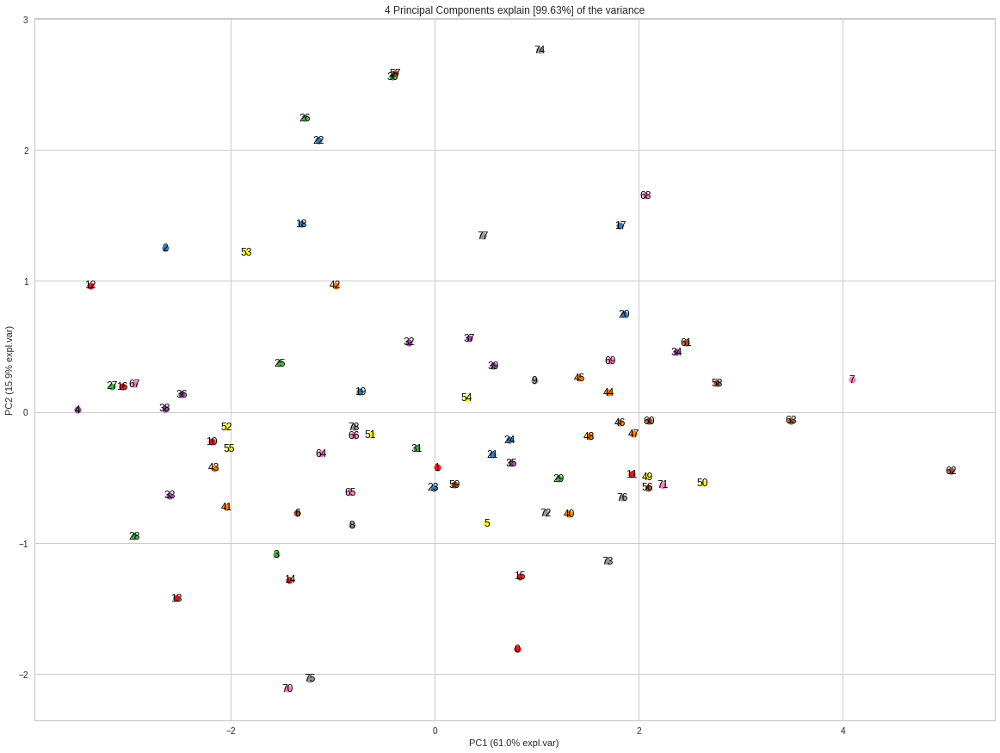

In [39]:
model.scatter(label=True, legend=False)

# Eigenvectors

In [40]:
A = out['loadings'].T
A

,PC1,PC2,PC3,PC4
gravity,0.474332,-0.007447,0.035195,0.369370
ph,-0.168653,0.949644,0.072036,0.253731
osmo,0.507943,0.089635,-0.203757,0.028850
cond,0.392481,0.270166,-0.526283,-0.589409
urea,0.467374,-0.059084,0.056115,0.503889
calc,0.340705,0.116646,0.819715,-0.443899


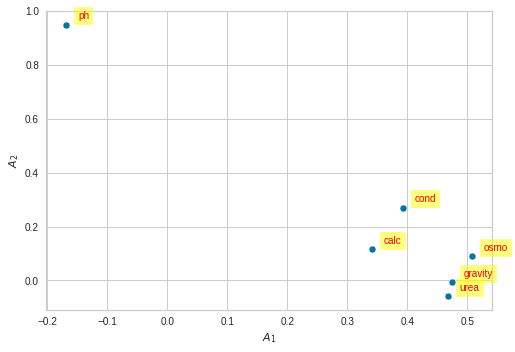

In [41]:
sns.scatterplot(data=A, x="PC1", y="PC2")
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for i in range(A.shape[0]):
 plt.text(x=A.PC1[i]+0.02,y=A.PC2[i]+0.02, s=variables[i],
          fontdict=dict(color='red',size=10),
          bbox=dict(facecolor='yellow',alpha=0.5))

Scree Plot

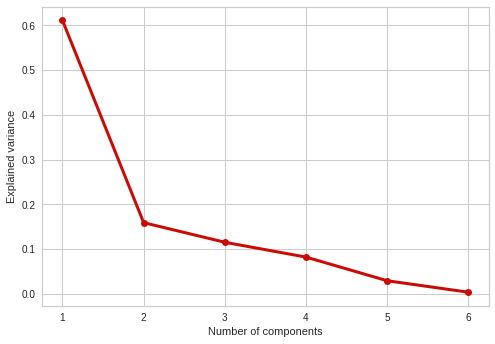

In [42]:
VR = out['variance_ratio']
x = np.arange(len(VR)) + 1
plt.plot(x, VR, 'ro-', lw=3)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance') 
plt.show()

Explained Variance Plot

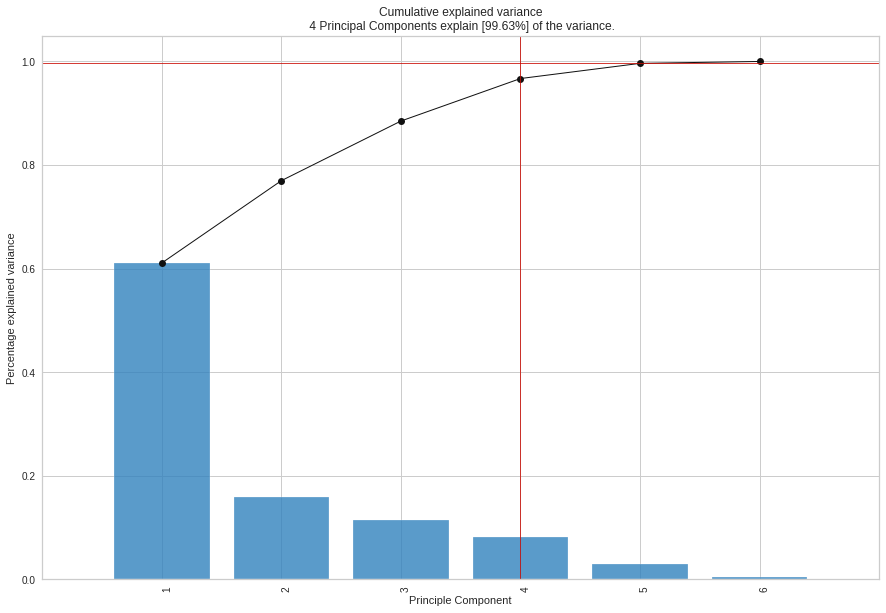

<Figure size 576x396 with 0 Axes>

In [43]:
model.plot();

# Biplot

[pca] >Plot PC1 vs PC2 with loadings.
[colourmap]> Warning: Colormap [Set1] can not create [79] unique colors! Available unique colors: [9].
[colourmap]> Warning: Colormap [Set1] can not create [79] unique colors! Available unique colors: [9].


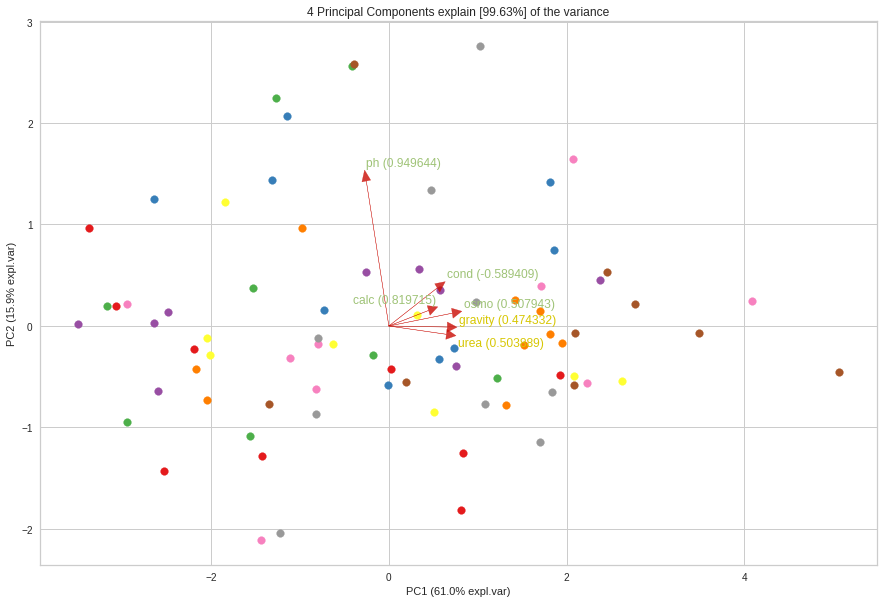

(<Figure size 1080x720 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7fb34f658220>)

In [44]:
model.biplot(label=False, legend=False)

[pca] >Plot PC1 vs PC2 vs PC3 with loadings.
[colourmap]> Warning: Colormap [Set1] can not create [79] unique colors! Available unique colors: [9].
[colourmap]> Warning: Colormap [Set1] can not create [79] unique colors! Available unique colors: [9].


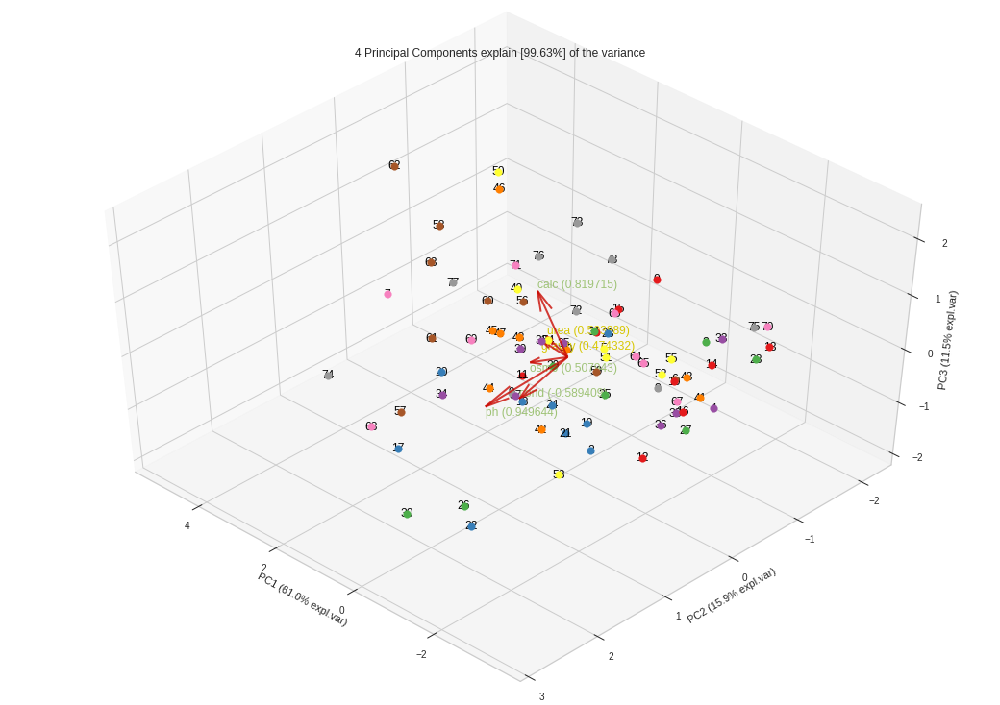

(<Figure size 1080x720 with 2 Axes>,
 <mpl_toolkits.mplot3d.axes3d.Axes3D at 0x7fb34e550250>)

In [45]:
model.biplot3d(legend=False)

In [100]:
print(out['topfeat'])

    PC  feature   loading  type
0  PC1     osmo  0.507943  best
1  PC2       ph  0.949644  best
2  PC3     calc  0.819715  best
3  PC4     cond -0.589409  best
4  PC1  gravity  0.474332  weak
5  PC4     urea  0.503889  weak


## Classification

Using PyCaret

In [101]:
#For Google Colab only
from pycaret.utils import enable_colab 
enable_colab()

Colab mode enabled.


In [102]:
data = df.sample(frac=0.9, random_state=786)
data_unseen = df.drop(data.index)

data.reset_index(drop=True, inplace=True)
data_unseen.reset_index(drop=True, inplace=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions: ' + str(data_unseen.shape))

Data for Modeling: (71, 7)
Unseen Data For Predictions: (8, 7)


In [103]:
pip install scikit-learn

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [104]:
from pycaret.classification import *
clf = setup(data=data, target='target', train_size=0.7, session_id=123)

,Description,Value
0,session_id,123
1,Target,target
2,Target Type,Binary
3,Label Encoded,None
4,Original Data,"(71, 7)"
5,Missing Values,False
6,Numeric Features,6
7,Categorical Features,0
8,Ordinal Features,False
9,High Cardinality Features,False


INFO:logs:create_model_container: 0
INFO:logs:master_model_container: 0
INFO:logs:display_container: 1
INFO:logs:Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=True, features_todrop=[],
                                      id_columns=[],
                                      ml_usecase='classification',
                                      numerical_features=[], target='target',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='not_available',
                                fill_value_categorical=None,
                                fill_value_numerical=None,
                                numeric_strat...
                ('scaling', 'passthrough'), ('P_transform', 'passthrough'),
                ('binn', 'passthrough'), ('rem_outliers', 'passthrough'),
                ('cluste


## Comparing All Models

In [135]:
#show the best model and their statistics
best_model = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
dt,Decision Tree Classifier,0.840,0.8250,0.7333,0.9250,0.7957,0.6579,0.6949,0.024
gbc,Gradient Boosting Classifier,0.775,0.8500,0.6833,0.7917,0.7090,0.5170,0.5506,0.110
lr,Logistic Regression,0.770,0.9000,0.7667,0.7850,0.7407,0.4888,0.5096,0.385
qda,Quadratic Discriminant Analysis,0.755,0.8500,0.6500,0.7167,0.6481,0.4674,0.5081,0.019
svm,SVM - Linear Kernel,0.750,0.0000,0.7333,0.7667,0.7114,0.4664,0.5041,0.025
ridge,Ridge Classifier,0.750,0.0000,0.6833,0.7000,0.6648,0.4503,0.4762,0.027
lda,Linear Discriminant Analysis,0.750,0.9000,0.6833,0.7000,0.6648,0.4503,0.4762,0.022
nb,Naive Bayes,0.735,0.8667,0.6667,0.7667,0.6681,0.4511,0.4989,0.024
rf,Random Forest Classifier,0.730,0.8167,0.7000,0.8000,0.7014,0.4416,0.4858,0.405
knn,K Neighbors Classifier,0.715,0.7667,0.6500,0.7183,0.6407,0.3755,0.4156,0.038


INFO:logs:create_model_container: 24
INFO:logs:master_model_container: 24
INFO:logs:display_container: 12
INFO:logs:DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=123, splitter='best')
INFO:logs:compare_models() succesfully completed......................................


## Create Decision Tree Classifier

In [53]:
dt = create_model('dt')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.6000,0.5833,0.5000,0.5000,0.5000,0.1667,0.1667
1,0.6000,0.6667,1.0000,0.5000,0.6667,0.2857,0.4082
2,0.8000,0.8333,1.0000,0.6667,0.8000,0.6154,0.6667
3,0.6000,0.5833,0.5000,0.5000,0.5000,0.1667,0.1667
4,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
5,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
6,0.8000,0.7500,1.0000,0.7500,0.8571,0.5455,0.6124
7,0.8000,0.8333,0.6667,1.0000,0.8000,0.6154,0.6667
8,0.8000,0.7500,1.0000,0.7500,0.8571,0.5455,0.6124
9,0.7500,0.7500,1.0000,0.6667,0.8000,0.5000,0.5774


INFO:logs:create_model_container: 15
INFO:logs:master_model_container: 15
INFO:logs:display_container: 3
INFO:logs:DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=123, splitter='best')
INFO:logs:create_model() succesfully completed......................................


In [54]:
#trained model object is stored in the variable 'dt'. 
dt

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=123, splitter='best')

# Tune Decision Tree Model

In [55]:
tuned_dt = tune_model(dt)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8000,0.6667,0.5000,1.0000,0.6667,0.5455,0.6124
1,0.6000,0.5000,0.5000,0.5000,0.5000,0.1667,0.1667
2,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
3,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
4,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
5,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
6,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
7,0.8000,0.7500,0.6667,1.0000,0.8000,0.6154,0.6667
8,0.8000,0.7500,1.0000,0.7500,0.8571,0.5455,0.6124
9,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000


INFO:logs:create_model_container: 16
INFO:logs:master_model_container: 16
INFO:logs:display_container: 4
INFO:logs:DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=6, max_features=1.0, max_leaf_nodes=None,
                       min_impurity_decrease=0.0001, min_impurity_split=None,
                       min_samples_leaf=4, min_samples_split=10,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=123, splitter='best')
INFO:logs:tune_model() succesfully completed......................................


In [105]:
#tuned model object is stored in the variable 'tuned_dt'. 
tuned_dt

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=6, max_features=1.0, max_leaf_nodes=None,
                       min_impurity_decrease=0.0001, min_impurity_split=None,
                       min_samples_leaf=4, min_samples_split=10,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=123, splitter='best')

# Evaluate Decision Tree Model

In [106]:
!pip install statsmodels --upgrade

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [57]:
evaluate_model(tuned_dt)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=6, max_features=1.0, max_leaf_nodes=None,
                       min_impurity_decrease=0.0001, min_impurity_split=None,
                       min_samples_leaf=4, min_samples_split=10,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=123, splitter='best'), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

# Create Logistic Regression Model

In [61]:
lr = create_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.80,1.0000,0.5000,1.0000,0.6667,0.5455,0.6124
1,0.80,0.5000,0.5000,1.0000,0.6667,0.5455,0.6124
2,0.80,0.6667,0.5000,1.0000,0.6667,0.5455,0.6124
3,0.60,0.8333,0.5000,0.5000,0.5000,0.1667,0.1667
4,0.80,1.0000,0.6667,1.0000,0.8000,0.6154,0.6667
5,1.00,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
6,1.00,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
7,0.80,0.8333,0.6667,1.0000,0.8000,0.6154,0.6667
8,0.60,1.0000,1.0000,0.6000,0.7500,0.0000,0.0000
9,1.00,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000


INFO:logs:create_model_container: 19
INFO:logs:master_model_container: 19
INFO:logs:display_container: 7
INFO:logs:LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)
INFO:logs:create_model() succesfully completed......................................


# Tune Logistic Regression Model

In [62]:
tuned_lr = tune_model(lr)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.80,1.0000,0.5000,1.0000,0.6667,0.5455,0.6124
1,0.80,0.5000,0.5000,1.0000,0.6667,0.5455,0.6124
2,0.80,0.6667,0.5000,1.0000,0.6667,0.5455,0.6124
3,0.60,0.8333,0.5000,0.5000,0.5000,0.1667,0.1667
4,0.80,1.0000,0.6667,1.0000,0.8000,0.6154,0.6667
5,1.00,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
6,1.00,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
7,0.80,0.8333,0.6667,1.0000,0.8000,0.6154,0.6667
8,0.60,1.0000,1.0000,0.6000,0.7500,0.0000,0.0000
9,1.00,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000


INFO:logs:create_model_container: 20
INFO:logs:master_model_container: 20
INFO:logs:display_container: 8
INFO:logs:LogisticRegression(C=0.472, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=1000, multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)
INFO:logs:tune_model() succesfully completed......................................


# Evaluate Logistic Regression Model

In [63]:
evaluate_model(tuned_lr)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=LogisticRegression(C=0.472, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=1000, multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

# **Tune the Best Model**

In [67]:
# Tune hyperparameters with scikit-learn (default)
tuned_best_model = tune_model(best_model)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.80,0.8333,0.5000,1.0000,0.6667,0.5455,0.6124
1,0.60,0.8333,0.5000,0.5000,0.5000,0.1667,0.1667
2,1.00,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
3,0.80,0.8333,0.5000,1.0000,0.6667,0.5455,0.6124
4,0.80,1.0000,0.6667,1.0000,0.8000,0.6154,0.6667
5,1.00,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
6,0.80,1.0000,1.0000,0.7500,0.8571,0.5455,0.6124
7,0.80,0.8333,0.6667,1.0000,0.8000,0.6154,0.6667
8,0.80,1.0000,1.0000,0.7500,0.8571,0.5455,0.6124
9,1.00,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000


INFO:logs:create_model_container: 23
INFO:logs:master_model_container: 23
INFO:logs:display_container: 11
INFO:logs:LGBMClassifier(bagging_fraction=0.9, bagging_freq=3, boosting_type='gbdt',
               class_weight=None, colsample_bytree=1.0, feature_fraction=0.5,
               importance_type='split', learning_rate=0.4, max_depth=-1,
               min_child_samples=6, min_child_weight=0.001, min_split_gain=0.3,
               n_estimators=20, n_jobs=-1, num_leaves=150, objective=None,
               random_state=123, reg_alpha=0.005, reg_lambda=0.0005,
               silent='warn', subsample=1.0, subsample_for_bin=200000,
               subsample_freq=0)
INFO:logs:tune_model() succesfully completed......................................


# Evaluate the Best Model

In [68]:
evaluate_model(tuned_best_model)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=LGBMClassifier(bagging_fraction=0.9, bagging_freq=3, boosting_type='gbdt',
               class_weight=None, colsample_bytree=1.0, feature_fraction=0.5,
               importance_type='split', learning_rate=0.4, max_depth=-1,
               min_child_samples=6, min_child_weight=0.001, min_split_gain=0.3,
               n_estimators=20, n_jobs=-1, num_leaves=150, objective=None,
               random_state=123, reg_alpha=0.005, reg_lambda=0.0005,
               silent='warn', subsample=1.0, subsample_for_bin=200000,
               subsample_freq=0), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

# **Classification + PCA**

In [107]:
clf_pca = setup(data=data, target='target', train_size=0.7, session_id=123, normalize = True, pca = True, pca_components = 3)

,Description,Value
0,session_id,123
1,Target,target
2,Target Type,Binary
3,Label Encoded,None
4,Original Data,"(71, 7)"
5,Missing Values,False
6,Numeric Features,6
7,Categorical Features,0
8,Ordinal Features,False
9,High Cardinality Features,False


INFO:logs:create_model_container: 0
INFO:logs:master_model_container: 0
INFO:logs:display_container: 1
INFO:logs:Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=True, features_todrop=[],
                                      id_columns=[],
                                      ml_usecase='classification',
                                      numerical_features=[], target='target',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='not_available',
                                fill_value_categorical=None,
                                fill_value_numerical=None,
                                numeric_strat...
                ('dummy', Dummify(target='target')),
                ('fix_perfect', Remove_100(target='target')),
                ('clean_names', Clean_Colum_Names()),
     

In [70]:
#show the best model and their statistics
best_model_pca = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
dt,Decision Tree Classifier,0.840,0.8250,0.7333,0.9250,0.7957,0.6579,0.6949,0.013
gbc,Gradient Boosting Classifier,0.775,0.8500,0.6833,0.7917,0.7090,0.5170,0.5506,0.055
lr,Logistic Regression,0.770,0.9000,0.7667,0.7850,0.7407,0.4888,0.5096,0.038
qda,Quadratic Discriminant Analysis,0.755,0.8500,0.6500,0.7167,0.6481,0.4674,0.5081,0.012
svm,SVM - Linear Kernel,0.750,0.0000,0.7333,0.7667,0.7114,0.4664,0.5041,0.013
ridge,Ridge Classifier,0.750,0.0000,0.6833,0.7000,0.6648,0.4503,0.4762,0.011
lda,Linear Discriminant Analysis,0.750,0.9000,0.6833,0.7000,0.6648,0.4503,0.4762,0.013
nb,Naive Bayes,0.735,0.8667,0.6667,0.7667,0.6681,0.4511,0.4989,0.013
rf,Random Forest Classifier,0.730,0.8167,0.7000,0.8000,0.7014,0.4416,0.4858,0.193
knn,K Neighbors Classifier,0.715,0.7667,0.6500,0.7183,0.6407,0.3755,0.4156,0.057


INFO:logs:create_model_container: 14
INFO:logs:master_model_container: 14
INFO:logs:display_container: 2
INFO:logs:DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=123, splitter='best')
INFO:logs:compare_models() succesfully completed......................................


In [71]:
best_model_pca

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=123, splitter='best')

# **Tune the Best Model**

In [72]:
# Tune hyperparameters with scikit-learn (default)
tuned_best_model_pca = tune_model(best_model_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.6000,0.1667,0.0000,0.0,0.0000,0.0000,0.0000
1,0.8000,0.8333,0.5000,1.0,0.6667,0.5455,0.6124
2,0.8000,0.5000,0.5000,1.0,0.6667,0.5455,0.6124
3,0.8000,0.9167,0.5000,1.0,0.6667,0.5455,0.6124
4,0.8000,0.7500,0.6667,1.0,0.8000,0.6154,0.6667
5,1.0000,1.0000,1.0000,1.0,1.0000,1.0000,1.0000
6,1.0000,1.0000,1.0000,1.0,1.0000,1.0000,1.0000
7,0.8000,0.9167,0.6667,1.0,0.8000,0.6154,0.6667
8,1.0000,1.0000,1.0000,1.0,1.0000,1.0000,1.0000
9,0.7500,0.5000,0.5000,1.0,0.6667,0.5000,0.5774


INFO:logs:create_model_container: 15
INFO:logs:master_model_container: 15
INFO:logs:display_container: 3
INFO:logs:DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=4, max_features='log2', max_leaf_nodes=None,
                       min_impurity_decrease=0.0002, min_impurity_split=None,
                       min_samples_leaf=5, min_samples_split=5,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=123, splitter='best')
INFO:logs:tune_model() succesfully completed......................................


In [73]:
tuned_best_model_pca

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=4, max_features='log2', max_leaf_nodes=None,
                       min_impurity_decrease=0.0002, min_impurity_split=None,
                       min_samples_leaf=5, min_samples_split=5,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=123, splitter='best')

# Evaluate the Best Model

In [74]:
evaluate_model(tuned_best_model_pca)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=4, max_features='log2', max_leaf_nodes=None,
                       min_impurity_decrease=0.0002, min_impurity_split=None,
                       min_samples_leaf=5, min_samples_split=5,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=123, splitter='best'), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

In [108]:
lr_pca = create_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8000,1.0000,0.5000,1.0000,0.6667,0.5455,0.6124
1,0.8000,0.5000,0.5000,1.0000,0.6667,0.5455,0.6124
2,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
3,0.4000,0.6667,0.0000,0.0000,0.0000,-0.3636,-0.4082
4,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
5,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
6,0.8000,1.0000,1.0000,0.7500,0.8571,0.5455,0.6124
7,0.8000,0.8333,0.6667,1.0000,0.8000,0.6154,0.6667
8,0.6000,1.0000,1.0000,0.6000,0.7500,0.0000,0.0000
9,0.5000,1.0000,1.0000,0.5000,0.6667,0.0000,0.0000


INFO:logs:create_model_container: 1
INFO:logs:master_model_container: 1
INFO:logs:display_container: 2
INFO:logs:LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)
INFO:logs:create_model() succesfully completed......................................


In [109]:
tuned_lr_pca = tune_model(lr_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.6000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000
1,0.8000,0.5000,0.5000,1.0000,0.6667,0.5455,0.6124
2,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
3,0.4000,0.6667,0.0000,0.0000,0.0000,-0.3636,-0.4082
4,0.8000,1.0000,0.6667,1.0000,0.8000,0.6154,0.6667
5,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
6,0.8000,1.0000,1.0000,0.7500,0.8571,0.5455,0.6124
7,0.8000,0.8333,0.6667,1.0000,0.8000,0.6154,0.6667
8,0.8000,1.0000,1.0000,0.7500,0.8571,0.5455,0.6124
9,0.7500,1.0000,1.0000,0.6667,0.8000,0.5000,0.5774


INFO:logs:create_model_container: 2
INFO:logs:master_model_container: 2
INFO:logs:display_container: 3
INFO:logs:LogisticRegression(C=8.866, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=1000, multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)
INFO:logs:tune_model() succesfully completed......................................


In [110]:
tuned_lr_pca

LogisticRegression(C=8.866, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=1000, multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [111]:
evaluate_model(tuned_lr_pca)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=LogisticRegression(C=8.866, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=1000, multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

In [114]:
dt_pca = create_model('dt')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.80,0.7500,0.5000,1.0000,0.6667,0.5455,0.6124
1,0.80,0.7500,0.5000,1.0000,0.6667,0.5455,0.6124
2,0.60,0.5833,0.5000,0.5000,0.5000,0.1667,0.1667
3,0.80,0.7500,0.5000,1.0000,0.6667,0.5455,0.6124
4,0.80,0.8333,0.6667,1.0000,0.8000,0.6154,0.6667
5,1.00,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
6,0.80,0.7500,1.0000,0.7500,0.8571,0.5455,0.6124
7,0.80,0.8333,0.6667,1.0000,0.8000,0.6154,0.6667
8,1.00,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
9,1.00,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000


INFO:logs:create_model_container: 5
INFO:logs:master_model_container: 5
INFO:logs:display_container: 6
INFO:logs:DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=123, splitter='best')
INFO:logs:create_model() succesfully completed......................................


In [117]:
tuned_dt_pca = tune_model(dt_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.6000,0.1667,0.0000,0.0,0.0000,0.0000,0.0000
1,0.8000,0.8333,0.5000,1.0,0.6667,0.5455,0.6124
2,0.8000,0.5000,0.5000,1.0,0.6667,0.5455,0.6124
3,0.8000,0.9167,0.5000,1.0,0.6667,0.5455,0.6124
4,0.8000,0.7500,0.6667,1.0,0.8000,0.6154,0.6667
5,1.0000,1.0000,1.0000,1.0,1.0000,1.0000,1.0000
6,1.0000,1.0000,1.0000,1.0,1.0000,1.0000,1.0000
7,0.8000,0.9167,0.6667,1.0,0.8000,0.6154,0.6667
8,1.0000,1.0000,1.0000,1.0,1.0000,1.0000,1.0000
9,0.7500,0.5000,0.5000,1.0,0.6667,0.5000,0.5774


INFO:logs:create_model_container: 8
INFO:logs:master_model_container: 8
INFO:logs:display_container: 9
INFO:logs:DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=4, max_features='log2', max_leaf_nodes=None,
                       min_impurity_decrease=0.0002, min_impurity_split=None,
                       min_samples_leaf=5, min_samples_split=5,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=123, splitter='best')
INFO:logs:tune_model() succesfully completed......................................


In [119]:
tuned_dt_pca

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=4, max_features='log2', max_leaf_nodes=None,
                       min_impurity_decrease=0.0002, min_impurity_split=None,
                       min_samples_leaf=5, min_samples_split=5,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=123, splitter='best')

In [120]:
evaluate_model(tuned_dt_pca)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=4, max_features='log2', max_leaf_nodes=None,
                       min_impurity_decrease=0.0002, min_impurity_split=None,
                       min_samples_leaf=5, min_samples_split=5,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=123, splitter='best'), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

In [127]:
gbc_pca = create_model('gbc')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8000,0.6667,0.5000,1.0000,0.6667,0.5455,0.6124
1,0.8000,0.8333,0.5000,1.0000,0.6667,0.5455,0.6124
2,0.6000,0.8333,0.5000,0.5000,0.5000,0.1667,0.1667
3,0.4000,0.6667,0.0000,0.0000,0.0000,-0.3636,-0.4082
4,0.8000,0.8333,0.6667,1.0000,0.8000,0.6154,0.6667
5,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
6,0.8000,0.8333,1.0000,0.7500,0.8571,0.5455,0.6124
7,0.8000,0.8333,0.6667,1.0000,0.8000,0.6154,0.6667
8,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
9,0.7500,1.0000,1.0000,0.6667,0.8000,0.5000,0.5774


INFO:logs:create_model_container: 9
INFO:logs:master_model_container: 9
INFO:logs:display_container: 10
INFO:logs:GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='deviance', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=2,
                           min_weight_fraction_leaf=0.0, n_estimators=100,
                           n_iter_no_change=None, presort='deprecated',
                           random_state=123, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)
INFO:logs:create_model() succesfully completed......................................


In [128]:
tuned_gbc_pca = tune_model(gbc_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8000,1.0000,0.5000,1.0000,0.6667,0.5455,0.6124
1,0.6000,0.5833,0.5000,0.5000,0.5000,0.1667,0.1667
2,0.6000,0.6667,0.5000,0.5000,0.5000,0.1667,0.1667
3,0.8000,0.8333,0.5000,1.0000,0.6667,0.5455,0.6124
4,0.8000,0.6667,0.6667,1.0000,0.8000,0.6154,0.6667
5,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
6,0.8000,1.0000,1.0000,0.7500,0.8571,0.5455,0.6124
7,0.8000,0.6667,0.6667,1.0000,0.8000,0.6154,0.6667
8,0.8000,1.0000,1.0000,0.7500,0.8571,0.5455,0.6124
9,0.7500,1.0000,1.0000,0.6667,0.8000,0.5000,0.5774


INFO:logs:create_model_container: 10
INFO:logs:master_model_container: 10
INFO:logs:display_container: 11
INFO:logs:GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.4, loss='deviance', max_depth=7,
                           max_features='sqrt', max_leaf_nodes=None,
                           min_impurity_decrease=0.3, min_impurity_split=None,
                           min_samples_leaf=4, min_samples_split=10,
                           min_weight_fraction_leaf=0.0, n_estimators=190,
                           n_iter_no_change=None, presort='deprecated',
                           random_state=123, subsample=0.7, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)
INFO:logs:tune_model() succesfully completed......................................


In [129]:
tuned_gbc_pca

GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.4, loss='deviance', max_depth=7,
                           max_features='sqrt', max_leaf_nodes=None,
                           min_impurity_decrease=0.3, min_impurity_split=None,
                           min_samples_leaf=4, min_samples_split=10,
                           min_weight_fraction_leaf=0.0, n_estimators=190,
                           n_iter_no_change=None, presort='deprecated',
                           random_state=123, subsample=0.7, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)

In [130]:
evaluate_model(tuned_gbc_pca)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.4, loss='deviance', max_depth=7,
                           max_features='sqrt', max_leaf_nodes=None,
                           min_impurity_decrease=0.3, min_impurity_split=None,
                           min_samples_leaf=4, min_samples_split=10,
                           min_weight_fraction_leaf=0.0, n_estimators=190,
                           n_iter_no_change=None, presort='deprecated',
                           random_state=123, subsample=0.7, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

# **Explainable AI with Shapley values**

In [75]:
!pip install shap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [76]:
print("Numpy version: ", np.__version__)

Numpy version:  1.21.6


In [77]:
!pip install numba==0.53

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 3.4 MB 4.2 MB/s 
     |████████████████████████████████| 25.3 MB 59.2 MB/s 
  Attempting uninstall: llvmlite
    Found existing installation: llvmlite 0.39.1
    Uninstalling llvmlite-0.39.1:
      Successfully uninstalled llvmlite-0.39.1
  Attempting uninstall: numba
    Found existing installation: numba 0.56.4
    Uninstalling numba-0.56.4:
      Successfully uninstalled numba-0.56.4


In [78]:
import shap

In [79]:
dt_pca = create_model('dt')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.80,0.7500,0.5000,1.0000,0.6667,0.5455,0.6124
1,0.80,0.7500,0.5000,1.0000,0.6667,0.5455,0.6124
2,0.60,0.5833,0.5000,0.5000,0.5000,0.1667,0.1667
3,0.80,0.7500,0.5000,1.0000,0.6667,0.5455,0.6124
4,0.80,0.8333,0.6667,1.0000,0.8000,0.6154,0.6667
5,1.00,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
6,0.80,0.7500,1.0000,0.7500,0.8571,0.5455,0.6124
7,0.80,0.8333,0.6667,1.0000,0.8000,0.6154,0.6667
8,1.00,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
9,1.00,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000


INFO:logs:create_model_container: 16
INFO:logs:master_model_container: 16
INFO:logs:display_container: 4
INFO:logs:DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=123, splitter='best')
INFO:logs:create_model() succesfully completed......................................


In [80]:
tuned_dt_pca = tune_model(dt_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.6000,0.1667,0.0000,0.0,0.0000,0.0000,0.0000
1,0.8000,0.8333,0.5000,1.0,0.6667,0.5455,0.6124
2,0.8000,0.5000,0.5000,1.0,0.6667,0.5455,0.6124
3,0.8000,0.9167,0.5000,1.0,0.6667,0.5455,0.6124
4,0.8000,0.7500,0.6667,1.0,0.8000,0.6154,0.6667
5,1.0000,1.0000,1.0000,1.0,1.0000,1.0000,1.0000
6,1.0000,1.0000,1.0000,1.0,1.0000,1.0000,1.0000
7,0.8000,0.9167,0.6667,1.0,0.8000,0.6154,0.6667
8,1.0000,1.0000,1.0000,1.0,1.0000,1.0000,1.0000
9,0.7500,0.5000,0.5000,1.0,0.6667,0.5000,0.5774


INFO:logs:create_model_container: 17
INFO:logs:master_model_container: 17
INFO:logs:display_container: 5
INFO:logs:DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=4, max_features='log2', max_leaf_nodes=None,
                       min_impurity_decrease=0.0002, min_impurity_split=None,
                       min_samples_leaf=5, min_samples_split=5,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=123, splitter='best')
INFO:logs:tune_model() succesfully completed......................................


# SHAP Summary Plot

INFO:logs:Initializing interpret_model()
INFO:logs:interpret_model(estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=4, max_features='log2', max_leaf_nodes=None,
                       min_impurity_decrease=0.0002, min_impurity_split=None,
                       min_samples_leaf=5, min_samples_split=5,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=123, splitter='best'), use_train_data=False, X_new_sample=None, y_new_sample=None, feature=None, kwargs={}, observation=None, plot=summary, save=False)
INFO:logs:Checking exceptions
INFO:logs:plot type: summary
INFO:logs:Creating TreeExplainer
INFO:logs:Compiling shap values


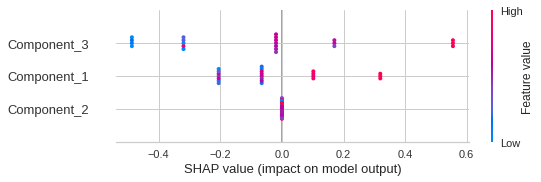

INFO:logs:Visual Rendered Successfully
INFO:logs:interpret_model() succesfully completed......................................


In [82]:
interpret_model(tuned_dt_pca, plot='summary')

In [83]:
#explainer = shap.TreeExplainer(tuned_dt_pca)
#X = df.drop('class', axis=1)
#shap_values = explainer.shap_values(X)
#shap.summary_plot(shap_values, X)

# Visualize a single prediction

In [85]:
interpret_model(tuned_dt_pca, plot='reason', observation=20)

INFO:logs:Initializing interpret_model()
INFO:logs:interpret_model(estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=4, max_features='log2', max_leaf_nodes=None,
                       min_impurity_decrease=0.0002, min_impurity_split=None,
                       min_samples_leaf=5, min_samples_split=5,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=123, splitter='best'), use_train_data=False, X_new_sample=None, y_new_sample=None, feature=None, kwargs={}, observation=20, plot=reason, save=False)
INFO:logs:Checking exceptions
INFO:logs:plot type: reason
INFO:logs:model type detected: type 1
INFO:logs:Creating TreeExplainer
INFO:logs:Compiling shap values
INFO:logs:model type detected: Unknown


INFO:logs:Visual Rendered Successfully
INFO:logs:interpret_model() succesfully completed......................................


# Visualize many predictions

In [86]:
interpret_model(tuned_dt_pca, plot='reason')

INFO:logs:Initializing interpret_model()
INFO:logs:interpret_model(estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=4, max_features='log2', max_leaf_nodes=None,
                       min_impurity_decrease=0.0002, min_impurity_split=None,
                       min_samples_leaf=5, min_samples_split=5,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=123, splitter='best'), use_train_data=False, X_new_sample=None, y_new_sample=None, feature=None, kwargs={}, observation=None, plot=reason, save=False)
INFO:logs:Checking exceptions
INFO:logs:plot type: reason
INFO:logs:model type detected: type 1
INFO:logs:Creating TreeExplainer
INFO:logs:Compiling shap values


INFO:logs:Visual Rendered Successfully
INFO:logs:interpret_model() succesfully completed......................................


In [87]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import plot_confusion_matrix

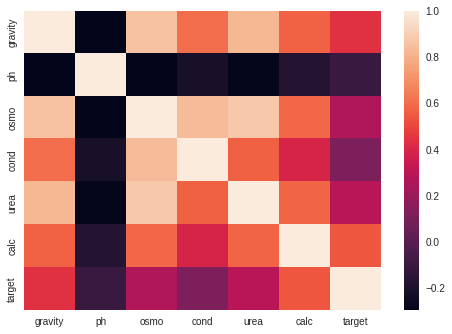

In [88]:
# Calculating the correlation matrix
corr = data.corr()
# Generating a heatmap
sns.heatmap(corr,xticklabels=corr.columns, yticklabels=corr.columns)

In [91]:
x = data.iloc[:,:6].values
y = data.iloc[:,6].values

In [92]:
from sklearn import preprocessing
from sklearn import utils

#convert y values to categorical values
lab = preprocessing.LabelEncoder()
y_transformed = lab.fit_transform(y)

#view transformed values
print(y_transformed)

[0 0 1 0 0 0 1 1 0 0 1 1 1 0 1 0 0 0 1 0 1 0 1 0 0 0 1 0 0 0 1 1 1 0 1 0 1
 0 1 0 0 1 0 0 1 0 0 0 1 1 1 0 1 1 1 0 0 0 0 1 0 0 0 0 0 1 1 1 0 1 1]


In [93]:
x = df.drop('target', axis=1)
y = df['target']

## **Confusion Matrix**

Accuracy of logistic regression classifier on test set: 0.92


Text(0.5, 352.48, 'Predicted label')

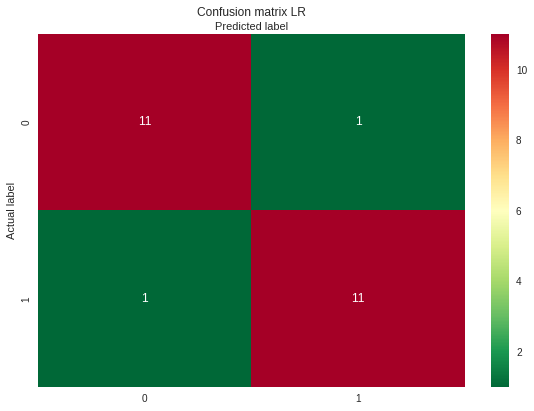

In [132]:
# import the class
from sklearn.linear_model import LogisticRegression
# import the metrics class
from sklearn import metrics

# split X and y into training and testing sets
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=0)

# instantiate the model (using the default parameters)
logreg = LogisticRegression(random_state=0)

# fit the model with data
logreg.fit(X_train, y_train)

y_pred = logreg.predict(X_test)

print('Accuracy of logistic regression classifier on test set: {:.2f}'.format(logreg.score(X_test, y_test)))

# import the metrics class
from sklearn import metrics

cnf_matrix = metrics.confusion_matrix(y_test, y_pred)
cnf_matrix


class_names=[0,1] # name  of classes
fig, ax = plt.subplots()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)
# create heatmap
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="RdYlGn_r",fmt='g' )
ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix LR', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

Accuracy of DT classifier on test set: 0.92


Text(0.5, 320.8, 'Predicted label')

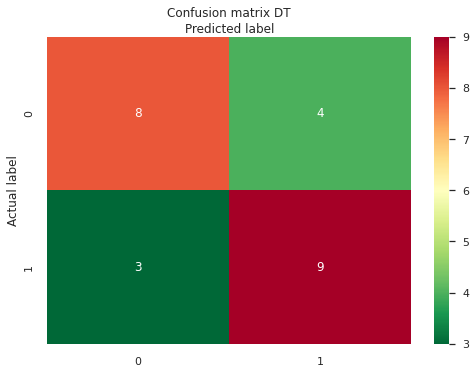

In [141]:
# import the class
from sklearn.tree import DecisionTreeClassifier
# import the metrics class
from sklearn import metrics

# split X and y into training and testing sets
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=0)

# instantiate the model (using the default parameters)
dt = DecisionTreeClassifier(random_state=0)

# fit the model with data
dt.fit(X_train, y_train)

y_pred = dt.predict(X_test)

print('Accuracy of DT classifier on test set: {:.2f}'.format(logreg.score(X_test, y_test)))

# import the metrics class
from sklearn import metrics

cnf_matrix = metrics.confusion_matrix(y_test, y_pred)
cnf_matrix


class_names=[0,1] # name  of classes
fig, ax = plt.subplots()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)
# create heatmap
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="RdYlGn_r",fmt='g' )
ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix DT', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

Accuracy of GB classifier on test set: 0.92


Text(0.5, 320.8, 'Predicted label')

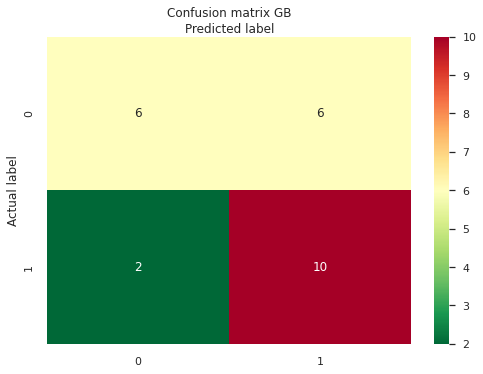

In [142]:
# import the class
from sklearn.ensemble import GradientBoostingClassifier
# import the metrics class
from sklearn import metrics

# split X and y into training and testing sets
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=0)

# instantiate the model (using the default parameters)
gb = GradientBoostingClassifier(random_state=0)

# fit the model with data
gb.fit(X_train, y_train)

y_pred = gb.predict(X_test)

print('Accuracy of GBC classifier on test set: {:.2f}'.format(logreg.score(X_test, y_test)))

# import the metrics class
from sklearn import metrics

cnf_matrix = metrics.confusion_matrix(y_test, y_pred)
cnf_matrix


class_names=[0,1] # name  of classes
fig, ax = plt.subplots()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)
# create heatmap
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="RdYlGn_r",fmt='g' )
ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix GB', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

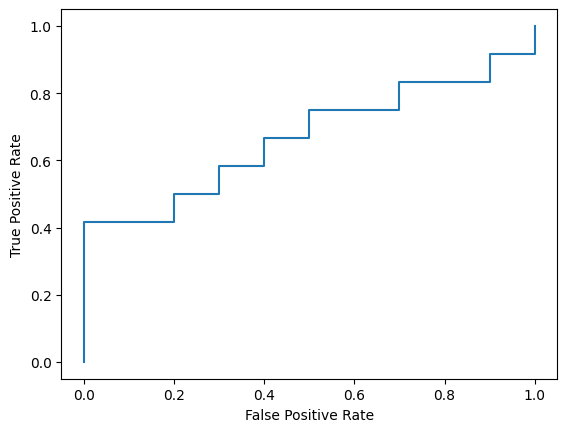

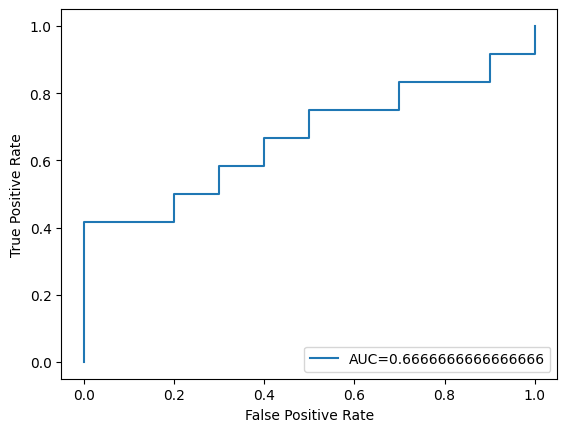

In [156]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
import matplotlib.pyplot as plt

x = data.iloc[:,:6].values
y = data.iloc[:,6].values

#split the dataset into training (70%) and testing (30%) sets
X_train,X_test,y_train,y_test = train_test_split(x,y,test_size=0.3,random_state=0) 

#instantiate the model
log_regression = LogisticRegression()

#fit the model using the training data
log_regression.fit(X_train,y_train)

#define metrics
y_pred_proba = log_regression.predict_proba(X_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)

#create ROC curve
plt.plot(fpr,tpr)
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

#define metrics
y_pred_proba = log_regression.predict_proba(X_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)
auc = metrics.roc_auc_score(y_test, y_pred_proba)

#create ROC curve
plt.plot(fpr,tpr,label="AUC="+str(auc))
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend(loc=4)
plt.show()

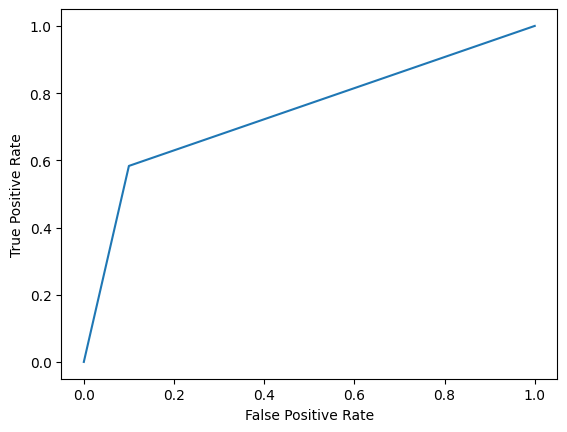

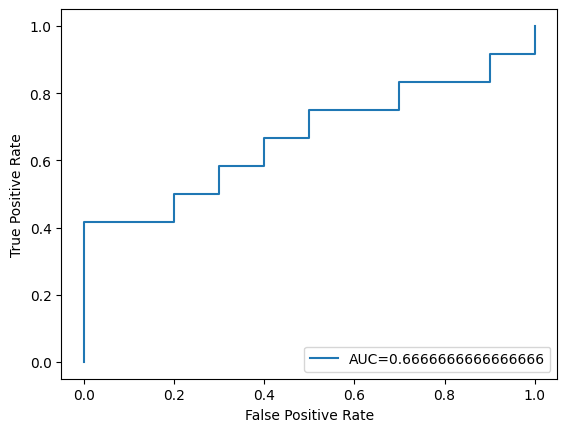

In [159]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn import metrics
import matplotlib.pyplot as plt

x = data.iloc[:,:6].values
y = data.iloc[:,6].values

#split the dataset into training (70%) and testing (30%) sets
X_train,X_test,y_train,y_test = train_test_split(x,y,test_size=0.3,random_state=0) 

#instantiate the model
dt = DecisionTreeClassifier()

#fit the model using the training data
dt.fit(X_train,y_train)

#define metrics
y_pred_proba = dt.predict_proba(X_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)

#create ROC curve
plt.plot(fpr,tpr)
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

#define metrics
y_pred_proba = log_regression.predict_proba(X_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)
auc = metrics.roc_auc_score(y_test, y_pred_proba)

#create ROC curve
plt.plot(fpr,tpr,label="AUC="+str(auc))
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend(loc=4)
plt.show()

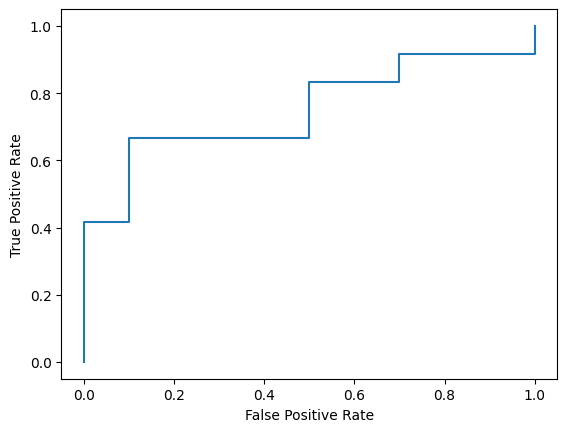

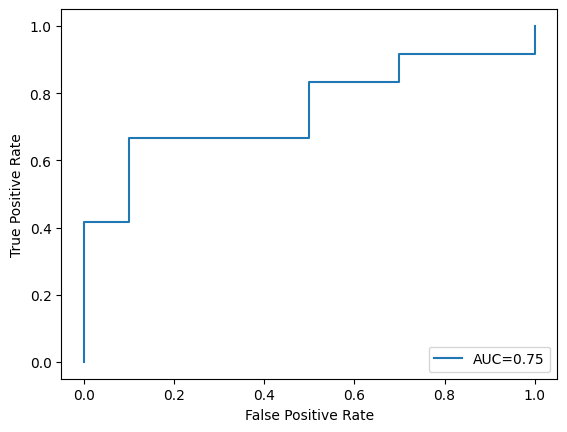

In [158]:
from sklearn.model_selection import train_test_split
from sklearn import metrics
import matplotlib.pyplot as plt

x = data.iloc[:,:6].values
y = data.iloc[:,6].values

#split the dataset into training (70%) and testing (30%) sets
X_train,X_test,y_train,y_test = train_test_split(x,y,test_size=0.3,random_state=0) 

#instantiate the model
gb = GradientBoostingClassifier(random_state=0)

#fit the model using the training data
gb.fit(X_train,y_train)

#define metrics
y_pred_proba = gb.predict_proba(X_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)

#create ROC curve
plt.plot(fpr,tpr)
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

#define metrics
y_pred_proba = gb.predict_proba(X_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)
auc = metrics.roc_auc_score(y_test, y_pred_proba)

#create ROC curve
plt.plot(fpr,tpr,label="AUC="+str(auc))
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend(loc=4)
plt.show()